<a href="https://colab.research.google.com/github/mokunosuke/StyleGAN/blob/main/generate_ayadao's_anime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# セットアップ

In [3]:
# github からコードをコピー
!git clone https://github.com/cedro3/stylegan2.git 

Cloning into 'stylegan2'...
remote: Enumerating objects: 328, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 328 (delta 15), reused 29 (delta 14), pack-reused 294
Receiving objects: 100% (328/328), 10.86 MiB | 22.25 MiB/s, done.
Resolving deltas: 100% (170/170), done.


In [4]:
# 学習済みの重みのダウンロード
! pip install --upgrade gdown
import gdown
gdown.download('https://drive.google.com/u/1/uc?id=1_NUX9_xRGjce1KbCxT4frUsFWctlN4ZC', 'network-tadne.pkl', quiet=False)

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for gdown: filename=gdown-4.4.0-py3-none-any.whl size=14774 sha256=bcf14e9a521e9c3c72b25fb10221205ac5bfb5fd59b08dc9384bb248735dc4ac
  Stored in directory: /root/.cache/pip/wheels/fb/c3/0e/c4d8ff8bfcb0461afff199471449f642179b74968c15b7a69c
Successfully built gdown
  Attempting uninstall: gdown
    Found existing installation: gdown 4.2.2
    Uninstalling gdown-4.2.2:
      Successfully uninstalled gdown-4.2.2


Downloading...
From: https://drive.google.com/u/1/uc?id=1_NUX9_xRGjce1KbCxT4frUsFWctlN4ZC
To: /content/network-tadne.pkl
100%|██████████| 1.06G/1.06G [00:07<00:00, 147MB/s]


'network-tadne.pkl'

In [5]:
# TensorFlow_plugin セッティングと関数定義
%tensorflow_version 1.x
%cd /content/stylegan2
from function import *

/content/stylegan2
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Compiling... Loading... Done.


# seedで指定した2枚の画像をブレンドした画像を生成する

Generating image for seed 6677 (0/2) ...


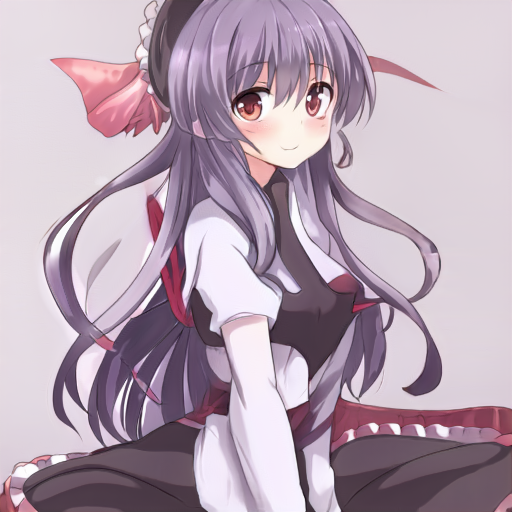

Generating image for seed 7561 (1/2) ...


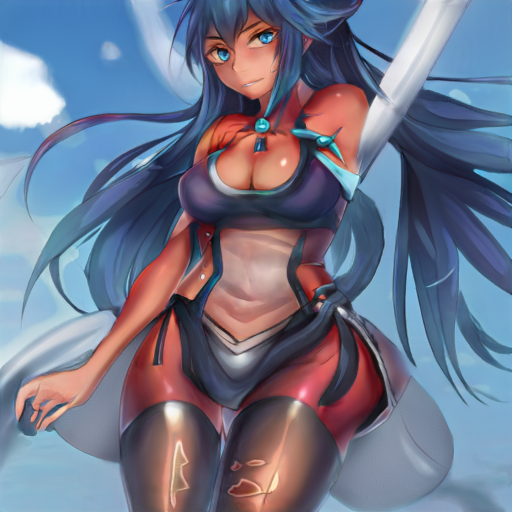

Blended image ( 0.5 )


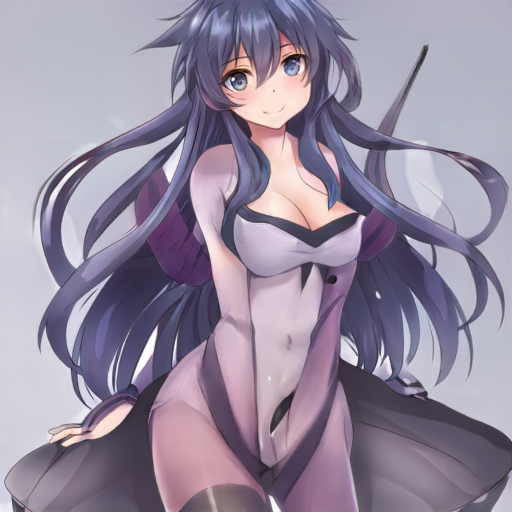

In [6]:
# seedで指定した2枚の画像をブレンドした画像を生成する 
src_seed =  6677  
dst_seed =  7561  
blending = 0.5 
truncation_psi = 0.8 
generate_images([src_seed, dst_seed], truncation_psi)

print("Blended image (", blending, ")")
blend_images(src_seed, dst_seed, blending=blending, truncation_psi=truncation_psi)

# seedで指定した2枚の画像をモーフィングする動画を生成する

Generating image for seed 5126 (0/2) ...


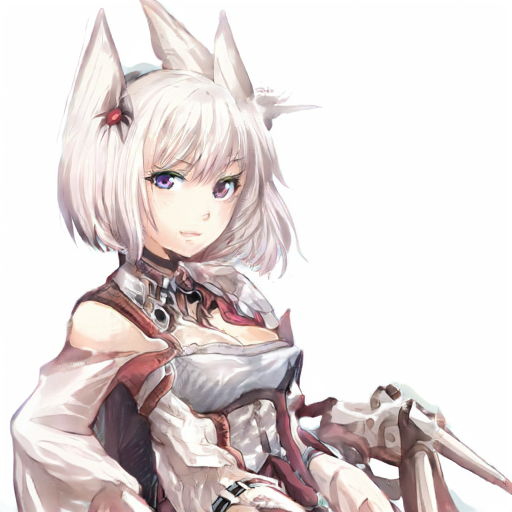

Generating image for seed 5805 (1/2) ...


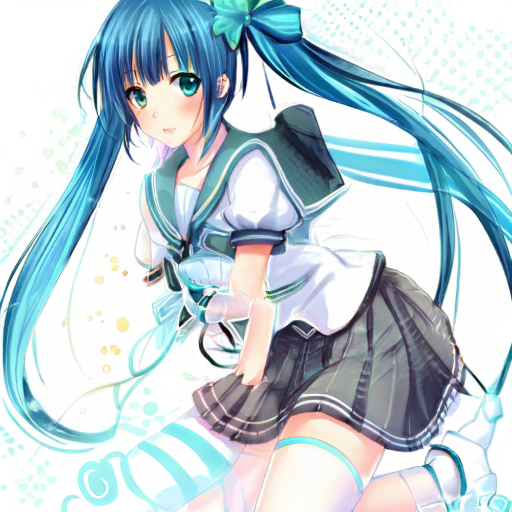

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2252800/45929032 bytes (4.9%)5799936/45929032 bytes (12.6%)8863744/45929032 bytes (19.3%)12312576/45929032 bytes (26.8%)15351808/45929032 bytes (33.4%)18759680/45929032 bytes (40.8%)21995520/45929032 bytes (47.9%)25427968/45929032 bytes (55.4%)28745728/45929032 bytes (62.6%)32243712/45929032 bytes (70.2%)35479552/45929032 bytes (77.2%)38797312/45929032 bytes (84.5%)

 99%|█████████▉| 100/101 [00:42<00:00,  2.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: interp_[5126, 5805, 5126]-0.7.mp4 



In [7]:
# seedで指定した2枚の画像をモーフィングする動画を生成する 
src_seed =  5126
dst_seed =  5805
truncation_psi = 0.7 
duration_sec = 5.0 
mp4_fps = 20

generate_images([src_seed, dst_seed], truncation_psi)
output_filename = interpolate_between_seeds(seed_array=[src_seed, dst_seed], truncation=truncation_psi, duration_sec=duration_sec, mp4_fps=mp4_fps)

In [8]:
# 生成した動画を再生する
display_mp4(output_filename)

Read from interp_[5126, 5805, 5126]-0.7.mp4


Display finished.


# ランダムにグリッドでモーフィング画像を生成する

In [9]:
# ランダムにグリッドでモーフィング画像を生成する 
random_seed = 822  
duration_sec = 5 
mp4_fps = 30 
grid_width =  2
grid_height =  2

output_filename = make_video(grid_size=[grid_width,grid_height], duration_sec=duration_sec, mp4_fps=mp4_fps, random_seed=random_seed)

[MoviePy] >>>> Building video random_grid_822.mp4
[MoviePy] Writing video random_grid_822.mp4


 99%|█████████▉| 150/151 [04:26<00:01,  1.77s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: random_grid_822.mp4 



In [13]:
# 生成した動画を再生する
display_mp4(output_filename)

Read from random_grid_822.mp4


Display finished.
